<a href="https://colab.research.google.com/github/freitas-oa/Computer-Vision/blob/main/cv_ppeproject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install ultralytics opencv-python roboflow numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 87.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 137.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


This is the baseline and its validation.

In [ ]:
from roboflow import Roboflow
from ultralytics import YOLO
import os

# === 1. DOWNLOAD DATASET ===
rf = Roboflow(api_key="Y89fnR5Fz37PMRQ6ljyY")
project = rf.workspace("joseph-nelson").project("hard-hat-workers")
dataset = project.version(10).download("yolov8")

# === 2. TRAIN CUSTOM PPE DETECTOR ===
model = YOLO("yolov8n.pt")
results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    name="hardhat_worker_detection"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Hard-Hat-Workers-10 in yolov8:: 100%|██████████| 14082/14082 [00:01<00:00, 10553.60it/s]


Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Hard-Hat-Workers-10/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=hardhat_worker_detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspe

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1442.1±632.3 MB/s, size: 42.7 KB)
val: Scanning /content/Hard-Hat-Workers-10/valid/labels.cache... 1413 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1413/1413 3.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 89/89 9.7it/s 9.2s
                   all       1413       5353      0.613      0.661       0.66      0.465
                  head        256       1339      0.852      0.965      0.958      0.677
                helmet       1297       3913      0.906      0.969      0.983      0.698
                person         32        101     0.0806     0.0495     0.0382      0.021
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /content/runs/detect/val


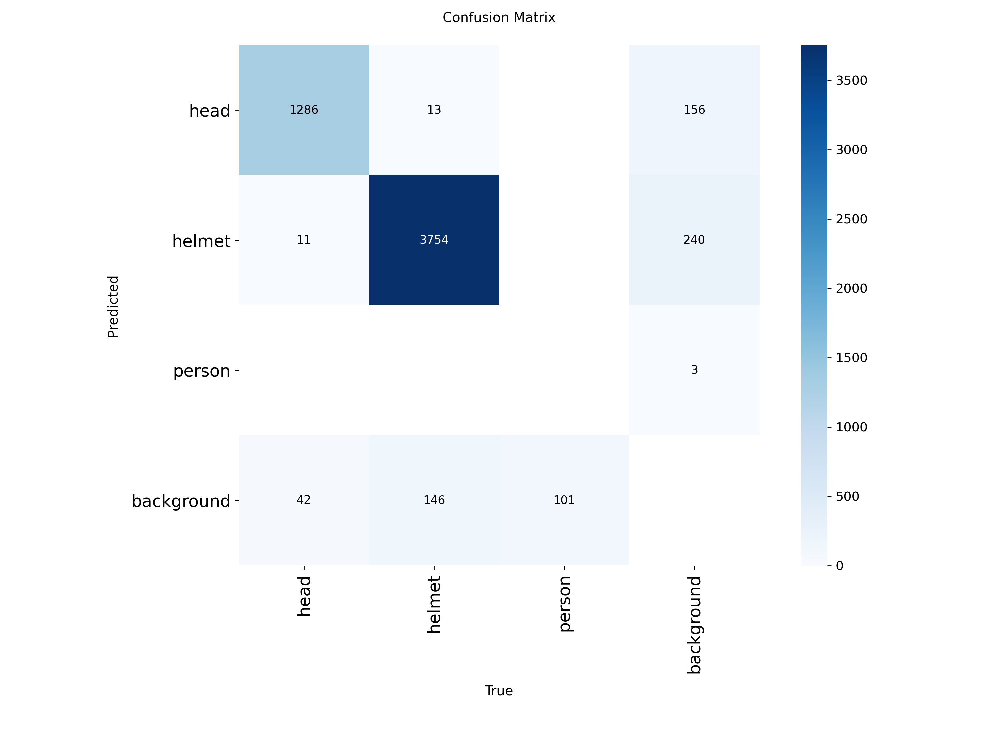


Precision-Recall Curve


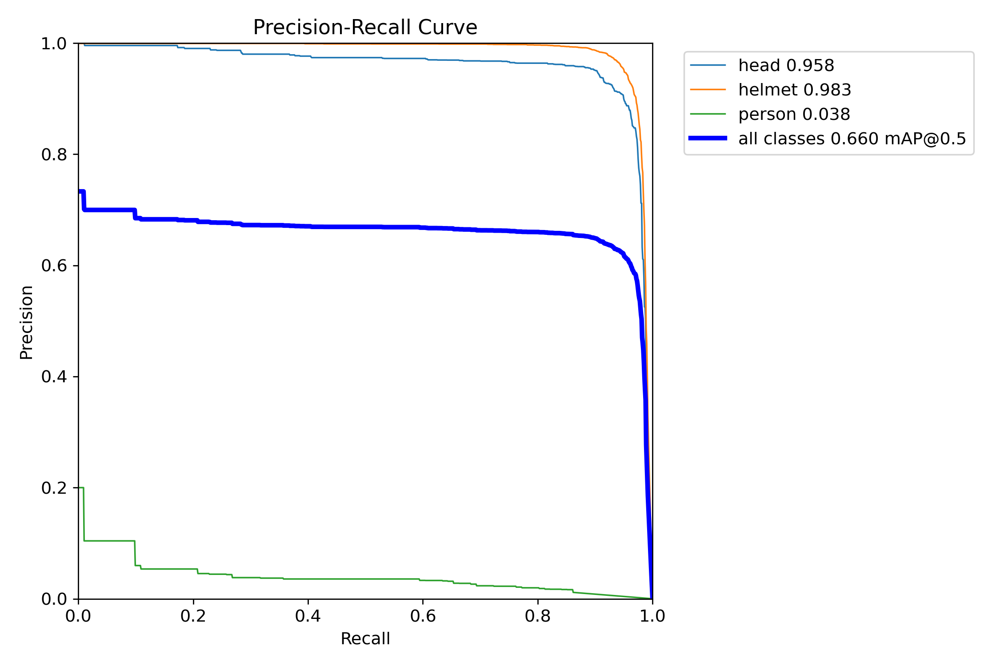


F1-Confidence Curve


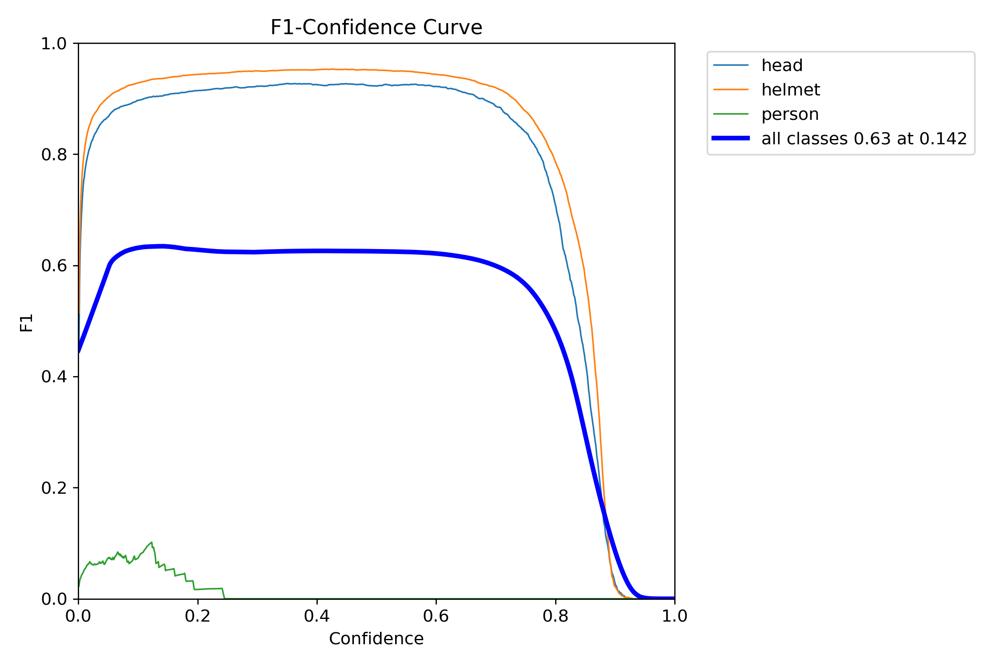


Results Table (text version)
mAP@50     : 0.6597
mAP@50:95  : 0.4653
Precision  : 0.6130
Recall     : 0.6611


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


All plots + confusion matrix + full results downloaded!
You now have perfect figures for your report


In [ ]:
# VALIDATION AND RESULTS

from ultralytics import YOLO
import matplotlib.pyplot as plt
from google.colab import files
import os

# Load existing trained model
model = YOLO("runs/detect/hardhat_worker_detection/weights/best.pt")

# Run validation (this creates the val folder with all plots)
results = model.val(data=f"{dataset.location}/data.yaml",
                    imgsz=640,
                    batch=16,
                    save=True,
                    plots=True,
                    conf=0.001)

val_folder = results.save_dir  # e.g., runs/detect/val2 or val3

print("\n" + "="*70)
print("            ALL RESULTS + PLOTS (WORKING VERSION)")
print("="*70)

# Show the 3 plots that ALWAYS exist
print("Confusion Matrix")
display(Image(os.path.join(val_folder, "confusion_matrix.png"), width=650))

print("\nPrecision-Recall Curve")
display(Image(os.path.join(val_folder, "BoxPR_curve.png"), width=650))

print("\nF1-Confidence Curve")
display(Image(os.path.join(val_folder, "BoxF1_curve.png"), width=650))

# If results.png exists → show it, otherwise print the table directly
results_png = os.path.join(val_folder, "results.png")
if os.path.exists(results_png):
    print("\nResults Table (image)")
    display(Image(results_png, width=900))
else:
    print("\nResults Table (text version)")
    print(f"mAP@50     : {results.results_dict['metrics/mAP50(B)']:.4f}")
    print(f"mAP@50:95  : {results.results_dict['metrics/mAP50-95(B)']:.4f}")
    print(f"Precision  : {results.results_dict['metrics/precision(B)']:.4f}")
    print(f"Recall     : {results.results_dict['metrics/recall(B)']:.4f}")

# Zip & download everything
!zip -q -r val_results_with_plots.zip {val_folder}
files.download("val_results_with_plots.zip")

print("\nAll plots + confusion matrix + full results downloaded!")
print("You now have perfect figures for your report")

The model is failing to detect small or hard helmets. We can confirm that looking at the confusion matrix and its mAP50-95 value.

In [ ]:
# CHANGING IMAGE SIZE TO COMPARE WITH OUR BASELINE MODEL

test960_model = YOLO("yolov8n.pt")
test960_results = test960_model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=30,
    imgsz=960,
    batch=16,
    name="test_960"
)

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Hard-Hat-Workers-10/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=test_960, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1384.5±425.5 MB/s, size: 37.4 KB)
val: Scanning /content/Hard-Hat-Workers-10/valid/labels.cache... 1413 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1413/1413 3.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 89/89 6.2it/s 14.4s
                   all       1413       5353      0.963      0.627      0.658      0.466
                  head        256       1339       0.93      0.936      0.961      0.684
                helmet       1297       3913      0.961      0.944      0.984      0.699
                person         32        101          1          0     0.0289      0.016
Speed: 1.1ms preprocess, 5.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/runs/detect/val

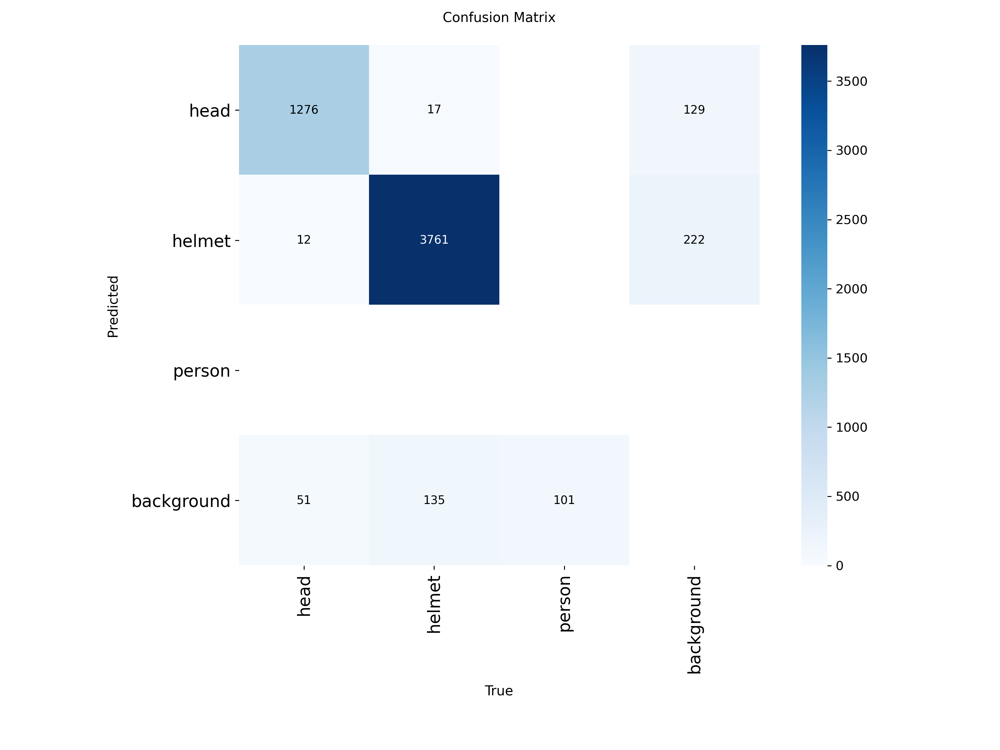


Precision-Recall Curve


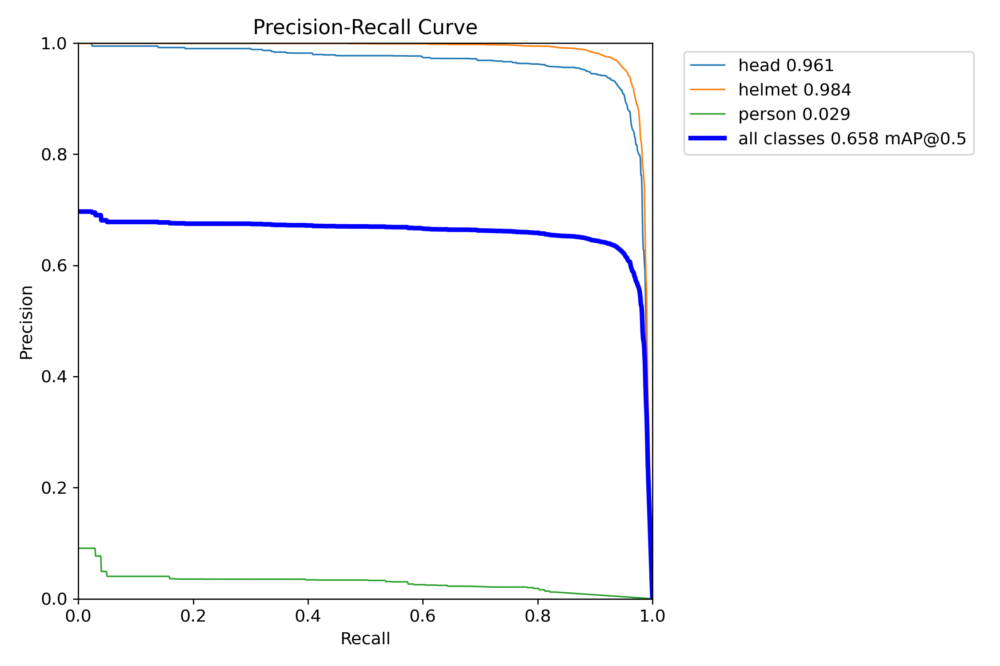


F1-Confidence Curve


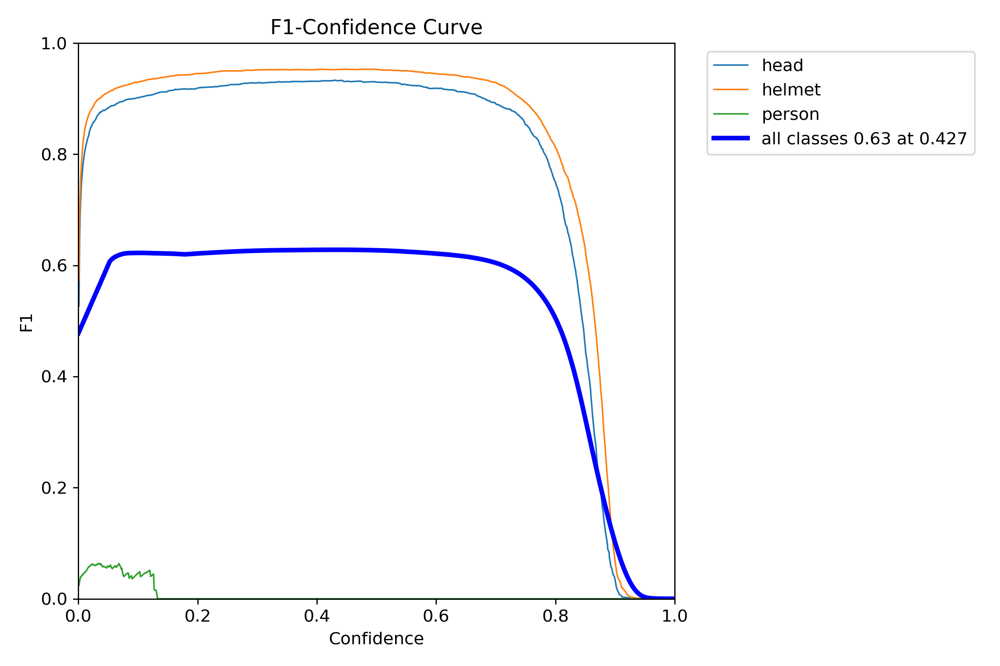


Results Table (text version)
mAP@50     : 0.6580
mAP@50:95  : 0.4663
Precision  : 0.9634
Recall     : 0.6265


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


All plots + confusion matrix + full results downloaded for test_960!


In [ ]:
# VALIDATION AND RESULTS FOR test_960 (imgsz = 960)

from ultralytics import YOLO
import matplotlib.pyplot as plt
from google.colab import files
from IPython.display import Image, display
import os

# Load trained model at 960
model = YOLO("runs/detect/test_960/weights/best.pt")

# Run validation
results = model.val(
    data=f"{dataset.location}/data.yaml",
    imgsz=960,
    batch=16,
    save=True,
    plots=True,
    conf=0.001
)

val_folder = results.save_dir  # e.g., runs/detect/val4

print("\n" + "="*70)
print("        ALL RESULTS + PLOTS FOR MODEL: test_960 (imgsz=960)")
print("="*70)

# Confusion Matrix
print("Confusion Matrix")
display(Image(os.path.join(val_folder, "confusion_matrix.png"), width=650))

# PR Curve
print("\nPrecision-Recall Curve")
display(Image(os.path.join(val_folder, "BoxPR_curve.png"), width=650))

# F1-Confidence Curve
print("\nF1-Confidence Curve")
display(Image(os.path.join(val_folder, "BoxF1_curve.png"), width=650))

# Results table
results_png = os.path.join(val_folder, "results.png")
if os.path.exists(results_png):
    print("\nResults Table (image)")
    display(Image(results_png, width=900))
else:
    print("\nResults Table (text version)")
    print(f"mAP@50     : {results.results_dict['metrics/mAP50(B)']:.4f}")
    print(f"mAP@50:95  : {results.results_dict['metrics/mAP50-95(B)']:.4f}")
    print(f"Precision  : {results.results_dict['metrics/precision(B)']:.4f}")
    print(f"Recall     : {results.results_dict['metrics/recall(B)']:.4f}")

# Zip & download everything
zip_name = "val_results_test_960_with_plots.zip"
!zip -q -r {zip_name} {val_folder}
files.download(zip_name)

print("\nAll plots + confusion matrix + full results downloaded for test_960!")


Analysing the baseline project with imgsz=960 did not show any improvement in the model.

In [ ]:
#Trying a different model to compare metrics

model_s_640 = YOLO("yolov8s.pt")
results_s_640 = model_s_640.train(
    data=f"{dataset.location}/data.yaml",
    epochs=50,        # quick test first
    imgsz=640,
    batch=16,
    name="yolov8s_640"
)


Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Hard-Hat-Workers-10/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8s_640, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, pl

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1341.4±456.8 MB/s, size: 37.4 KB)
val: Scanning /content/Hard-Hat-Workers-10/valid/labels.cache... 1413 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1413/1413 3.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 89/89 6.1it/s 14.7s
                   all       1413       5353      0.643      0.665      0.664      0.471
                  head        256       1339      0.881      0.963      0.967      0.686
                helmet       1297       3913      0.941      0.962      0.984      0.701
                person         32        101      0.106     0.0693     0.0411      0.025
Speed: 0.5ms preprocess, 6.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /content/runs/detect/v

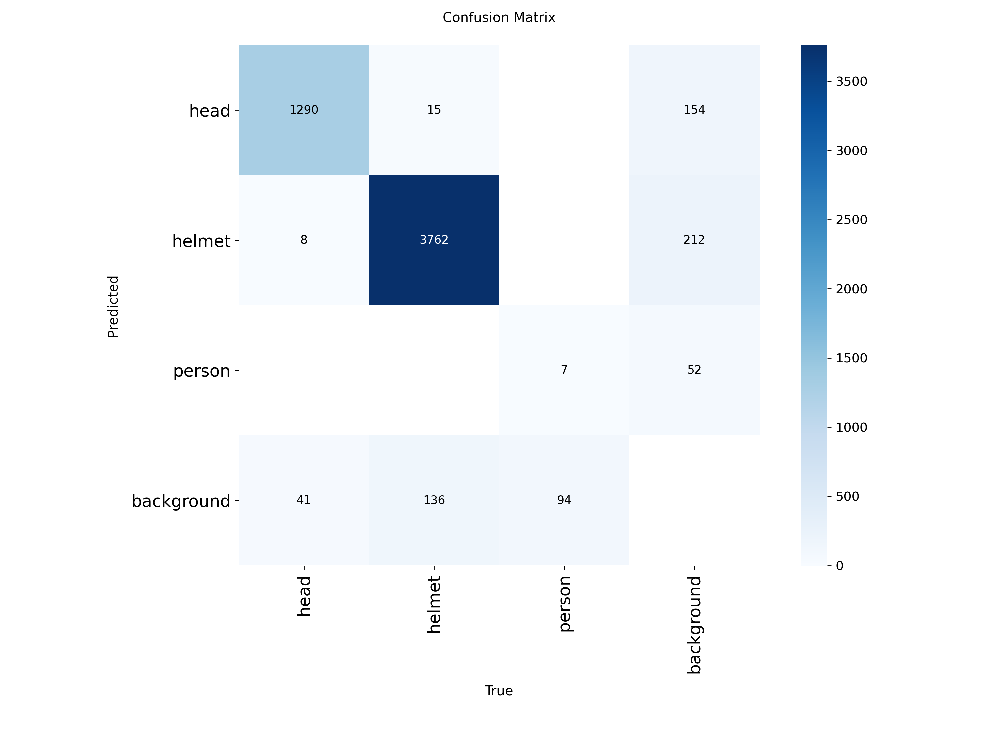


Precision-Recall Curve


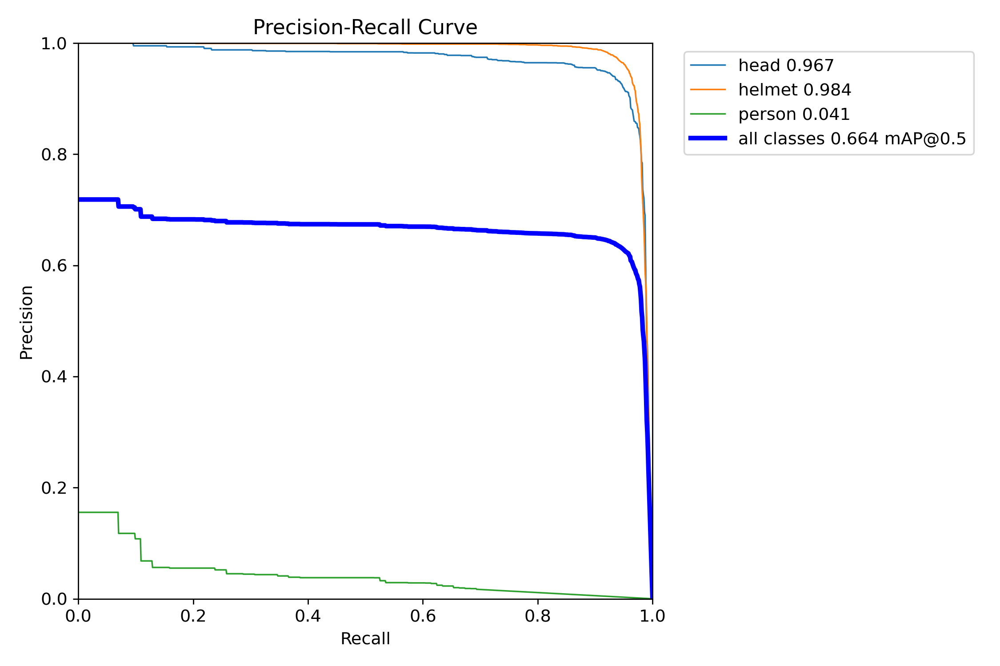


F1-Confidence Curve


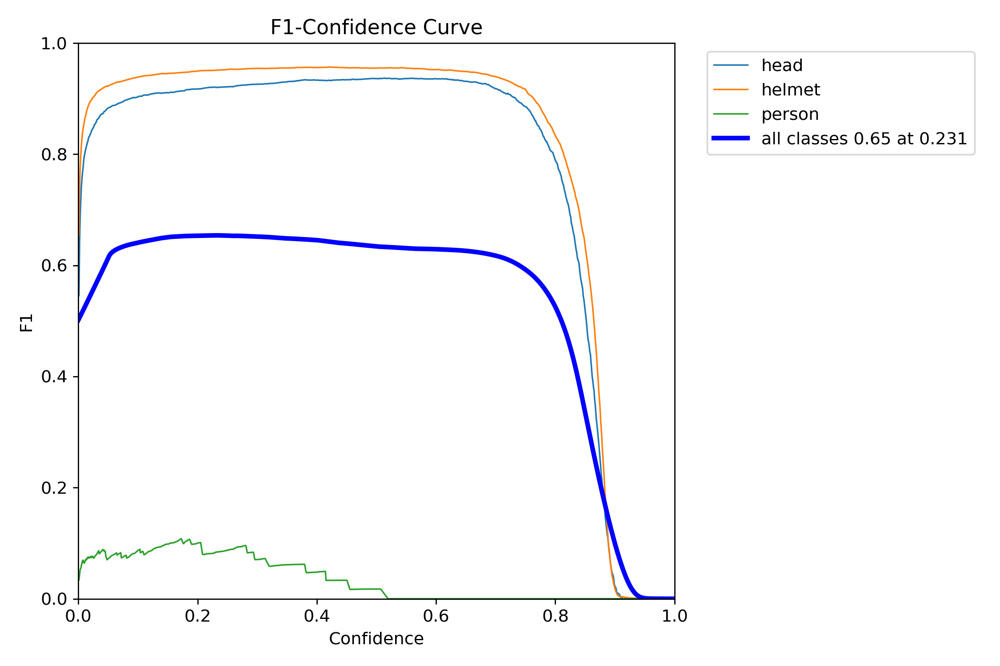


Results Table (text version)
mAP@50     : 0.6639
mAP@50:95  : 0.4707
Precision  : 0.6425
Recall     : 0.6649


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


All plots + confusion matrix + full results downloaded for yolov8s_640!


In [ ]:
# VALIDATION AND RESULTS FOR yolov8s_640

from ultralytics import YOLO
import matplotlib.pyplot as plt
from google.colab import files
from IPython.display import Image, display
import os

# Path to the model you trained (yolov8s, imgsz=640)
model_path = "runs/detect/yolov8s_640/weights/best.pt"

# Load model
model = YOLO(model_path)

# Run validation
results = model.val(
    data=f"{dataset.location}/data.yaml",
    imgsz=640,
    batch=16,
    save=True,
    plots=True,
    conf=0.001
)

val_folder = results.save_dir   # e.g., runs/detect/val5 or val6

print("\n" + "="*75)
print("        ALL RESULTS + PLOTS FOR MODEL: yolov8s_640 (imgsz=640)")
print("="*75)

# Confusion Matrix
print("Confusion Matrix")
display(Image(os.path.join(val_folder, "confusion_matrix.png"), width=650))

# PR Curve
print("\nPrecision-Recall Curve")
display(Image(os.path.join(val_folder, "BoxPR_curve.png"), width=650))

# F1-Confidence Curve
print("\nF1-Confidence Curve")
display(Image(os.path.join(val_folder, "BoxF1_curve.png"), width=650))

# Results table (image or text)
results_png = os.path.join(val_folder, "results.png")
if os.path.exists(results_png):
    print("\nResults Table (image)")
    display(Image(results_png, width=900))
else:
    print("\nResults Table (text version)")
    print(f"mAP@50     : {results.results_dict['metrics/mAP50(B)']:.4f}")
    print(f"mAP@50:95  : {results.results_dict['metrics/mAP50-95(B)']:.4f}")
    print(f"Precision  : {results.results_dict['metrics/precision(B)']:.4f}")
    print(f"Recall     : {results.results_dict['metrics/recall(B)']:.4f}")

# Zip and download
zip_name = "val_results_yolov8s_640_with_plots.zip"
!zip -q -r {zip_name} {val_folder}
files.download(zip_name)

print("\nAll plots + confusion matrix + full results downloaded for yolov8s_640!")


From YOLO8n to YOLO8s and 50 epochs - the model did not learn more.


image 1/1 /content/worker_image.png: 320x640 1 helmet, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)
Results saved to /content/runs/detect/predict10
------------------------------
Helmet detected! (Confidence: 0.89)
  - Box: 505, 34, 780, 308
------------------------------
⚠️ PARTIAL: Only Helmet was detected.
------------------------------


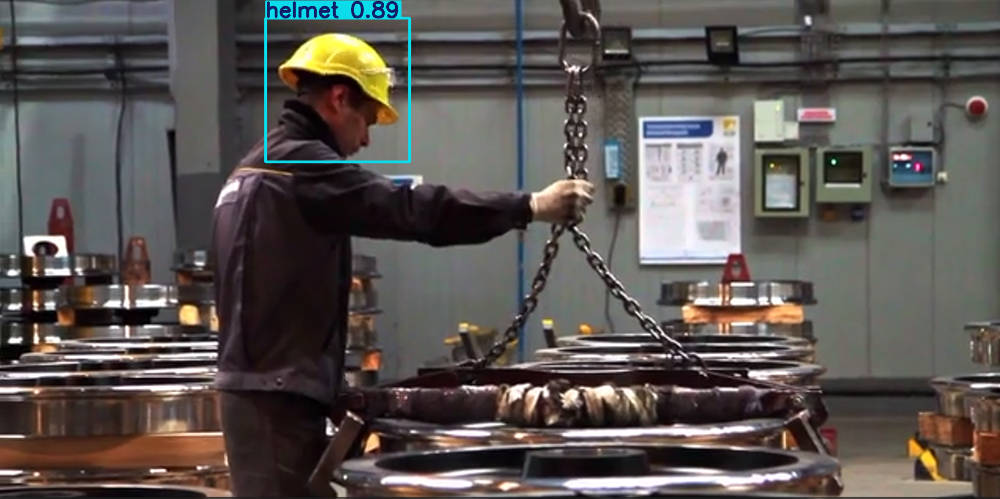

In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image
import cv2
import os

# 1. Load the model
model_path = 'runs/detect/yolov8s_640/weights/best.pt'
model = YOLO(model_path)

# 2. Define the image path
image_path = '/content/worker_image.png'

# 3. Run prediction (conf=0.1)
results = model.predict(source=image_path, save=True, conf=0.1)
result = results[0]

# 4. Search for "helmet" and "head" and track them separately
print("-" * 30)
helmet_detected = False
head_detected = False

for box in result.boxes:
    cls_id = int(box.cls[0])
    cls_name = result.names[cls_id].lower()
    conf = float(box.conf[0])
    x1, y1, x2, y2 = box.xyxy[0].tolist()

    if 'helmet' in cls_name:
        helmet_detected = True
        print(f"Helmet detected! (Confidence: {conf:.2f})")
        print(f"  - Box: {x1:.0f}, {y1:.0f}, {x2:.0f}, {y2:.0f}")

    elif 'head' in cls_name:
        head_detected = True
        print(f"Head detected! (Confidence: {conf:.2f})")
        print(f"  - Box: {x1:.0f}, {y1:.0f}, {x2:.0f}, {y2:.0f}")

print("-" * 30)

# 5. Summary Check
if helmet_detected and head_detected:
    print("✅ YES: Both Helmet and Head were detected.")
elif helmet_detected:
    print("⚠️ PARTIAL: Only Helmet was detected.")
elif head_detected:
    print("⚠️ PARTIAL: Only Head was detected.")
else:
    print("❌ NO: Neither was detected.")
print("-" * 30)

# 6. Generate and display the image
res_plotted = result.plot()
output_path = 'result_with_boxes.png'
cv2.imwrite(output_path, res_plotted)
display(Image(filename=output_path, width=800))

The model performed well for helmet when testing in different scenario, but it was not as good when detecting head.

In [ ]:
import cv2
import numpy as np
import os
from ultralytics import YOLO
from IPython.display import display, Video

# ==========================================
# 1. HELPER FUNCTIONS
# ==========================================

def calculate_iou(boxA, boxB):
    """
    Calculates Intersection over Union (IoU) between two boxes.
    Box format: [x1, y1, x2, y2]
    """
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0: return 0

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

def is_center_inside_head_zone(person_box, helmet_box, head_ratio=0.3):
    """
    Checks if the center of the helmet box is inside the upper region (head zone) of the person box.
    """
    px1, py1, px2, py2 = person_box[:4]
    hx1, hy1, hx2, hy2 = helmet_box[:4]

    h_center_x = (hx1 + hx2) / 2
    h_center_y = (hy1 + hy2) / 2

    p_height = py2 - py1
    head_y_max = py1 + (p_height * head_ratio)

    inside_x = px1 < h_center_x < px2
    inside_y = py1 < h_center_y < head_y_max

    return inside_x and inside_y

# ==========================================
# 2. CONFIGURATION & MODELS
# ==========================================

print("Loading models...")
model_person = YOLO('yolov8n.pt')
model_ppe = YOLO('runs/detect/yolov8s_640/weights/best.pt')

# Paths
video_path = '/content/test_video33.mp4'
output_raw_path = '/content/output_safety_v2.mp4'
output_display_path = '/content/output_safety_v2_final.mp4'

# Parameters
CONF_PERSON = 0.5
CONF_HELMET = 0.25

# --- ADJUSTMENT HERE ---
# Increased threshold to avoid false positives when bending.
# Person must be significantly wider than tall to trigger fall.
FALL_AR_THRESHOLD = 1.25

IOU_THRESHOLD = 0.05
HEAD_ZONE_RATIO = 0.3

# ==========================================
# 3. VIDEO PROCESSING LOOP
# ==========================================

cap = cv2.VideoCapture(video_path)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_raw_path, fourcc, fps, (width, height))

print(f"Starting processing... (Fall Threshold: AR > {FALL_AR_THRESHOLD})")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret: break

    # A. Run Inference
    results_person = model_person.predict(frame, classes=[0], conf=CONF_PERSON, verbose=False)
    results_ppe = model_ppe.predict(frame, conf=CONF_HELMET, verbose=False)

    person_boxes = results_person[0].boxes.data.cpu().numpy()
    helmet_boxes = results_ppe[0].boxes.data.cpu().numpy()

    # B. Process each person
    for p_box in person_boxes:
        px1, py1, px2, py2, _, _ = p_box
        p_w, p_h = px2 - px1, py2 - py1

        # --- Logic 1: Fall Detection (Aspect Ratio) ---
        aspect_ratio = p_w / p_h
        is_fallen = aspect_ratio > FALL_AR_THRESHOLD

        # --- Logic 2: Helmet Association (Hybrid) ---
        has_helmet = False
        head_box_iou = [px1, py1, px2, py1 + (p_h * HEAD_ZONE_RATIO)]

        for h_box in helmet_boxes:
            helmet_rect = h_box[:4]
            iou_val = calculate_iou(head_box_iou, helmet_rect)
            check_iou = iou_val > IOU_THRESHOLD
            check_geo = is_center_inside_head_zone(p_box, h_box, HEAD_ZONE_RATIO)

            if check_iou or check_geo:
                has_helmet = True
                cv2.rectangle(frame, (int(h_box[0]), int(h_box[1])), (int(h_box[2]), int(h_box[3])), (255, 0, 0), 2)
                break

        # --- Logic 3: Visuals ---
        status_text = "FALL DETECTED" if is_fallen else "STANDING"
        is_safe = (not is_fallen) and has_helmet
        color = (0, 255, 0) if is_safe else (0, 0, 255)

        label = f"{status_text} | Helmet: {'YES' if has_helmet else 'NO'}"

        # Draw Person Box
        cv2.rectangle(frame, (int(px1), int(py1)), (int(px2), int(py2)), color, 2)

        # Draw Label Background
        (w_label, h_label), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
        cv2.rectangle(frame, (int(px1), int(py1) - 20), (int(px1) + w_label, int(py1)), color, -1)
        cv2.putText(frame, label, (int(px1), int(py1) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        # --- DEBUG: Draw Aspect Ratio Value ---
        # This helps you see the number generated when he bends.
        ar_label = f"AR: {aspect_ratio:.2f}"
        cv2.putText(frame, ar_label, (int(px1), int(py2) + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 1)

    out.write(frame)

cap.release()
out.release()
print("Processing finished.")

# ==========================================
# 4. CONVERT & DISPLAY
# ==========================================

if os.path.exists(output_raw_path):
    print("Converting video...")
    os.system(f"ffmpeg -y -i {output_raw_path} -vcodec libx264 -crf 23 -preset fast {output_display_path} -hide_banner -loglevel error")
    display(Video(output_display_path, embed=True, width=800))
else:
    print("Error: Output file not found.")

Loading models...
Starting processing... (Fall Threshold: AR > 1.25)
Processing finished.
Converting video...


Analyses the IoU between the helmet box and the person box, plus geometric considerations, to evaluate if someone is wearing a helment or not and if is standing. Analyse the code for better understanding of the metrics and math.

In [ ]:
import os
import shutil
import datetime
from google.colab import drive

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Define source and destination
# We create a timestamped folder so you don't overwrite previous work
timestamp = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
destination_folder = f'/content/drive/MyDrive/Colab_Backup_{timestamp}'

# Create the destination folder
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)
    print(f"✅ Created backup folder: {destination_folder}")

# 3. Define what to exclude (Crucial to avoid infinite loops!)
# 'drive': The mount point itself.
# 'sample_data': Default Colab junk folder.
# '.config': Default Colab system folder.
exclude_list = ['drive', 'sample_data', '.config', '.ipynb_checkpoints']

# 4. Loop and Copy
source_dir = '/content'

print("⏳ Starting backup... This might take a while depending on file sizes.")

for item in os.listdir(source_dir):
    # Skip items in the exclude list
    if item in exclude_list:
        continue

    src_path = os.path.join(source_dir, item)
    dst_path = os.path.join(destination_folder, item)

    try:
        if os.path.isfile(src_path):
            shutil.copy2(src_path, dst_path)
            print(f"  -> Copied file: {item}")
        elif os.path.isdir(src_path):
            shutil.copytree(src_path, dst_path)
            print(f"  -> Copied folder: {item}")

    except Exception as e:
        print(f"  ❌ Error copying {item}: {e}")

print("-" * 30)
print(f"🎉 Backup successfully finished!")
print(f"📂 Check your Drive at: {destination_folder}")

Mounted at /content/drive
✅ Created backup folder: /content/drive/MyDrive/Colab_Backup_2025-12-01_23-43-17
⏳ Starting backup... This might take a while depending on file sizes.
  -> Copied file: yolov8s.pt
  -> Copied file: test_video2.mp4
  -> Copied file: output_safety_hybrid_raw.mp4
  -> Copied file: result_with_boxes.png
  -> Copied folder: runs
  -> Copied file: output_display.mp4
  -> Copied folder: Hard-Hat-Workers-10
  -> Copied file: val_results_yolov8s_640_with_plots.zip
  -> Copied file: test_video33.mp4
  -> Copied file: output_safety_check.mp4
  -> Copied file: output_safety_v2_final.mp4
  -> Copied file: output_safety_hybrid_final.mp4
  -> Copied file: output_safety_v2.mp4
  -> Copied file: val_results_with_plots.zip
  -> Copied file: yolo11n.pt
  -> Copied file: yolov8n.pt
  -> Copied file: worker_image.png
  -> Copied file: test_video.mp4
  -> Copied file: val_results_test_960_with_plots.zip
------------------------------
🎉 Backup successfully finished!
📂 Check your Dri

In [ ]:
import cv2
import numpy as np
import os
from ultralytics import YOLO
from IPython.display import display, Video

# ==========================================
# 1. HELPER FUNCTIONS
# ==========================================

def calculate_iou(boxA, boxB):
    """
    Calculates Intersection over Union (IoU) between two boxes.
    Box format: [x1, y1, x2, y2]
    """
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0: return 0

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

def is_center_inside_head_zone(person_box, helmet_box, head_ratio=0.3):
    """
    Checks if the center of the helmet box is inside the upper region (head zone) of the person box.
    """
    px1, py1, px2, py2 = person_box[:4]
    hx1, hy1, hx2, hy2 = helmet_box[:4]

    h_center_x = (hx1 + hx2) / 2
    h_center_y = (hy1 + hy2) / 2

    p_height = py2 - py1
    head_y_max = py1 + (p_height * head_ratio)

    inside_x = px1 < h_center_x < px2
    inside_y = py1 < h_center_y < head_y_max

    return inside_x and inside_y

# ==========================================
# 2. CONFIGURATION & MODELS
# ==========================================

print("Loading models...")
model_person = YOLO('yolov8n.pt')
model_ppe = YOLO('runs/detect/yolov8s_640/weights/best.pt')

# Paths
video_path = '/content/test_video33.mp4'
output_raw_path = '/content/output_safety_v2.mp4'
output_display_path = '/content/output_safety_v2_final.mp4'

# Parameters
CONF_PERSON = 0.5
CONF_HELMET = 0.25

# --- ADJUSTMENT HERE ---
# Increased threshold to avoid false positives when bending.
# Person must be significantly wider than tall to trigger fall.
FALL_AR_THRESHOLD = 1.25

IOU_THRESHOLD = 0.05
HEAD_ZONE_RATIO = 0.3

# ==========================================
# 3. VIDEO PROCESSING LOOP
# ==========================================

cap = cv2.VideoCapture(video_path)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_raw_path, fourcc, fps, (width, height))

print(f"Starting processing... (Fall Threshold: AR > {FALL_AR_THRESHOLD})")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret: break

    # A. Run Inference
    results_person = model_person.predict(frame, classes=[0], conf=CONF_PERSON, verbose=False)
    results_ppe = model_ppe.predict(frame, conf=CONF_HELMET, verbose=False)

    person_boxes = results_person[0].boxes.data.cpu().numpy()
    helmet_boxes = results_ppe[0].boxes.data.cpu().numpy()

    # B. Process each person
    for p_box in person_boxes:
        px1, py1, px2, py2, _, _ = p_box
        p_w, p_h = px2 - px1, py2 - py1

        # --- Logic 1: Fall Detection (Aspect Ratio) ---
        aspect_ratio = p_w / p_h
        is_fallen = aspect_ratio > FALL_AR_THRESHOLD

        # --- Logic 2: Helmet Association (Hybrid) ---
        has_helmet = False
        head_box_iou = [px1, py1, px2, py1 + (p_h * HEAD_ZONE_RATIO)]

        for h_box in helmet_boxes:
            helmet_rect = h_box[:4]
            iou_val = calculate_iou(head_box_iou, helmet_rect)
            check_iou = iou_val > IOU_THRESHOLD
            check_geo = is_center_inside_head_zone(p_box, h_box, HEAD_ZONE_RATIO)

            if check_iou or check_geo:
                has_helmet = True
                cv2.rectangle(frame, (int(h_box[0]), int(h_box[1])), (int(h_box[2]), int(h_box[3])), (255, 0, 0), 2)
                break

        # --- Logic 3: Visuals ---
        status_text = "FALL DETECTED" if is_fallen else "STANDING"
        is_safe = (not is_fallen) and has_helmet
        color = (0, 255, 0) if is_safe else (0, 0, 255)

        label = f"{status_text} | Helmet: {'YES' if has_helmet else 'NO'}"

        # Draw Person Box
        cv2.rectangle(frame, (int(px1), int(py1)), (int(px2), int(py2)), color, 2)

        # Draw Label Background
        (w_label, h_label), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
        cv2.rectangle(frame, (int(px1), int(py1) - 20), (int(px1) + w_label, int(py1)), color, -1)
        cv2.putText(frame, label, (int(px1), int(py1) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        # --- DEBUG: Draw Aspect Ratio Value ---
        # This helps you see the number generated when he bends.
        ar_label = f"AR: {aspect_ratio:.2f}"
        cv2.putText(frame, ar_label, (int(px1), int(py2) + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 1)

    out.write(frame)

cap.release()
out.release()
print("Processing finished.")

# ==========================================
# 4. CONVERT & DISPLAY
# ==========================================

if os.path.exists(output_raw_path):
    print("Converting video...")
    os.system(f"ffmpeg -y -i {output_raw_path} -vcodec libx264 -crf 23 -preset fast {output_display_path} -hide_banner -loglevel error")
    display(Video(output_display_path, embed=True, width=800))
else:
    print("Error: Output file not found.")

In [ ]:
# 1. Instalar o yt-dlp (ferramenta de download robusta)
!pip install yt-dlp -q

# 2. Baixar o clip do link fornecido
# O argumento -o define o nome do arquivo de saída para facilitar nosso uso depois
!yt-dlp "https://youtube.com/clip/Ugkxkav_44DNwkFVc6VUT1OEaXyI2q18DRNs?si=kZApqtKJAs_akYIx" -o "/content/worker_clip.mp4" --force-overwrites

print("✅ Download concluído! O arquivo 'worker_clip.mp4' está pronto.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.0/180.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 56.3 MB/s eta 0:00:00
[youtube:clip] Extracting URL: https://youtube.com/clip/Ugkxkav_44DNwkFVc6VUT1OEaXyI2q18DRNs?si=kZApqtKJAs_akYIx
[youtube:clip] Ugkxkav_44DNwkFVc6VUT1OEaXyI2q18DRNs: Downloading webpage
[youtube] Extracting URL: https://www.youtube.com/watch?v=rNwve0x6Mkk
[youtube] rNwve0x6Mkk: Downloading webpage
[youtube] rNwve0x6Mkk: Downloading android sdkless player API JSON
[youtube] rNwve0x6Mkk: Downloading web safari player API JSON
[youtube] rNwve0x6Mkk: Downloading m3u8 information
[info] Ugkxkav_44DNwkFVc6VUT1OEaXyI2q18DRNs: Downloading 1 format(s): 401+251-9
[download] Destination: /content/worker_clip.mp4.webm
[libdav1d @ 0x5762eb3988c0] libdav1d 0.9.2
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from 'https://rr2---sn-un57sne7.googlevideo.com/videoplayback?expire=1764655358&ei=niwuad7uJYiYpt8PjJqTgA0&ip=35.229.167.151&id=o-APTx9VWNwkq-muaF4X3U

In [ ]:
import cv2
import numpy as np
import os
from ultralytics import YOLO
from IPython.display import display, Video

# ==========================================
# 1. HELPER FUNCTIONS
# ==========================================

def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0: return 0

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    return interArea / float(boxAArea + boxBArea - interArea)

def is_center_inside_head_zone(person_box, helmet_box, head_ratio=0.3):
    px1, py1, px2, py2 = person_box[:4]
    hx1, hy1, hx2, hy2 = helmet_box[:4]

    h_center_x = (hx1 + hx2) / 2
    h_center_y = (hy1 + hy2) / 2

    p_height = py2 - py1
    head_y_max = py1 + (p_height * head_ratio)

    inside_x = px1 < h_center_x < px2
    inside_y = py1 < h_center_y < head_y_max

    return inside_x and inside_y

# ==========================================
# 2. CONFIGURATION & MODELS
# ==========================================

print("Loading models...")
model_person = YOLO('yolov8n.pt')
# Certifique-se que o seu modelo best.pt ainda está no Colab (se reiniciou, precisa subir de novo)
model_ppe = YOLO('runs/detect/yolov8s_640/weights/best.pt')

# PATHS (Updated for the YouTube Clip)
video_path = '/content/worker_clip.mp4'
output_raw_path = '/content/output_clip_safety.mp4'
output_display_path = '/content/output_clip_safety_final.mp4'

# Parameters
CONF_PERSON = 0.5
CONF_HELMET = 0.25
FALL_AR_THRESHOLD = 1.25
IOU_THRESHOLD = 0.05
HEAD_ZONE_RATIO = 0.3

# ==========================================
# 3. VIDEO PROCESSING LOOP
# ==========================================

if not os.path.exists(video_path):
    print(f"❌ Error: Video file not found at {video_path}. Did Step 1 finish successfully?")
else:
    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_raw_path, fourcc, fps, (width, height))

    print(f"Starting processing clip... (Fall AR > {FALL_AR_THRESHOLD})")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret: break

        # A. Run Inference
        results_person = model_person.predict(frame, classes=[0], conf=CONF_PERSON, verbose=False)
        results_ppe = model_ppe.predict(frame, conf=CONF_HELMET, verbose=False)

        person_boxes = results_person[0].boxes.data.cpu().numpy()
        helmet_boxes = results_ppe[0].boxes.data.cpu().numpy()

        # B. Process each person
        for p_box in person_boxes:
            px1, py1, px2, py2, _, _ = p_box
            p_w, p_h = px2 - px1, py2 - py1

            # Logic 1: Fall Detection
            aspect_ratio = p_w / p_h
            is_fallen = aspect_ratio > FALL_AR_THRESHOLD

            # Logic 2: Helmet Association (Hybrid)
            has_helmet = False
            head_box_iou = [px1, py1, px2, py1 + (p_h * HEAD_ZONE_RATIO)]

            for h_box in helmet_boxes:
                helmet_rect = h_box[:4]
                iou_val = calculate_iou(head_box_iou, helmet_rect)
                check_iou = iou_val > IOU_THRESHOLD
                check_geo = is_center_inside_head_zone(p_box, h_box, HEAD_ZONE_RATIO)

                if check_iou or check_geo:
                    has_helmet = True
                    cv2.rectangle(frame, (int(h_box[0]), int(h_box[1])), (int(h_box[2]), int(h_box[3])), (255, 0, 0), 2)
                    break

            # Logic 3: Visuals
            status_text = "FALL DETECTED" if is_fallen else "STANDING"
            is_safe = (not is_fallen) and has_helmet
            color = (0, 255, 0) if is_safe else (0, 0, 255)

            label = f"{status_text} | Helmet: {'YES' if has_helmet else 'NO'}"

            cv2.rectangle(frame, (int(px1), int(py1)), (int(px2), int(py2)), color, 2)

            # Label
            (w_label, h_label), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
            cv2.rectangle(frame, (int(px1), int(py1) - 20), (int(px1) + w_label, int(py1)), color, -1)
            cv2.putText(frame, label, (int(px1), int(py1) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        out.write(frame)

    cap.release()
    out.release()
    print("Processing finished.")

    # ==========================================
    # 4. CONVERT & DISPLAY
    # ==========================================

    if os.path.exists(output_raw_path):
        print("Converting video for web display...")
        os.system(f"ffmpeg -y -i {output_raw_path} -vcodec libx264 -crf 23 -preset fast {output_display_path} -hide_banner -loglevel error")
        display(Video(output_display_path, embed=True, width=800))
    else:
        print("Error: Output file not found.")

Loading models...
Starting processing clip... (Fall AR > 1.25)
Processing finished.
Converting video for web display...
Buffered data was truncated after reaching the output size limit.